# Simultaneously fit multiple lightcurves 

Here we will fit multiple lightcurves simultaneously using the global fitter in exotic. We will set up bounds for each lightcurve that specify what parameters to fit along with 'global' bounds that are shared between all lightcurves. 

![](https://s3.amazonaws.com/aasie/images/0004-6256/164/5/null/ajac8deef3_hr.jpg)

This notebook will show you how to reproduce something similar to Figure 4 in a study on HD 80606 b, https://ui.adsabs.harvard.edu/abs/2022AJ....164..178P/abstract 

Please cite that paper if you use this code

## Find lightcurve data in the Exoplanet Watch Database

The command `get` will fetch priors, light curves and an ephemeris (O-C) for each target.

In [1]:
from exotic.api.ew import ExoplanetWatch
from IPython.display import display, Image

# This will load the results JSON from the link above
EW = ExoplanetWatch()
print(EW.target_list)

# names are case and space sensitive
result = EW.get('WASP-1 b')

# list the result properties
result.__dict__.keys()

Loaded 278 targets
['CoRoT-11 b', 'CoRoT-14 b', 'CoRoT-18 b', 'CoRoT-1 b', 'CoRoT-27 b', 'CoRoT-29 b', 'CoRoT-2 b', 'CoRoT-7 b', 'CoRoT-8 b', 'CoRoTID 223977153 b', 'EPIC 206042996 c', 'Gaia-1 b', 'Gaia-2 b', 'GJ 1214 b', 'GJ 3470 b', 'GJ 436 b', 'GPX-1 b', 'HAT-P-11 b', 'HAT-P-12 b', 'HAT-P-13 b', 'HAT-P-16 b', 'HAT-P-17 b', 'HAT-P-18 b', 'HAT-P-19 b', 'HAT-P-1 b', 'HAT-P-20 b', 'HAT-P-21 b', 'HAT-P-22 b', 'HAT-P-23 b', 'HAT-P-25 b', 'HAT-P-26 b', 'HAT-P-27 b', 'HAT-P-28 b', 'HAT-P-29 b', 'HAT-P-30 b', 'HAT-P-32 b', 'HAT-P-33 b', 'HAT-P-36 b', 'HAT-P-37 b', 'HAT-P-39 b', 'HAT-P-3 b', 'HAT-P-41 b', 'HAT-P-44 b', 'HAT-P-45 b', 'HAT-P-49 b', 'HAT-P-4 b', 'HAT-P-51 b', 'HAT-P-52 b', 'HAT-P-53 b', 'HAT-P-54 b', 'HAT-P-55 b', 'HAT-P-56 b', 'HAT-P-57 b', 'HAT-P-59 b', 'HAT-P-5 b', 'HAT-P-68 b', 'HAT-P-6 b', 'HAT-P-70 b', 'HAT-P-7 b', 'HAT-P-8 b', 'HAT-P-9 b', 'HATS-18 b', 'HATS-24 b', 'HATS-33 b', 'HD 149026 b', 'HD 189733 b', 'HD 209458 b', 'HD 80606 b', 'K2-117 b', 'K2-123 b', 'K2-127 b', 

dict_keys(['raw_result', 'host', 'name', 'priors', 'timestamp', 'identifier', 'reduction_count', 'observation_count', 'ephemeris', 'observations'])

## Priors
A list of stellar and planetary parameters with references. These are used to calculate a light curve model with non-linear limb darkening.

In [2]:
result.priors

{'R*': {'units': 'Sol',
  'value': '1.52',
  'reference': 'Kokori%20et%20al.%202022',
  'uncertainty': '0.05'},
 'RA': {'units': 'decimal',
  'value': '5.1669536',
  'reference': None,
  'uncertainty': None},
 'Rp': {'units': 'R_Earth',
  'value': '17.7',
  'reference': 'ExoFOP-TESS%20TOI',
  'uncertainty': '0.9'},
 'T*': {'units': 'K',
  'value': '6116.0',
  'reference': 'ExoFOP-TESS%20TOI',
  'uncertainty': '106.58'},
 'Tc': {'units': 'BJD-TDB',
  'value': '2456543.33866',
  'reference': 'Ivshina%20&amp;%20Winn%202022',
  'uncertainty': '0.00028'},
 'DEC': {'units': 'decimal',
  'value': '31.9899732',
  'reference': None,
  'uncertainty': None},
 'Tcs': [{'units': 'BJD, BJD-TDB, HJD',
   'value': '2453912.5147133335',
   'reference': 'Turner%20et%20al.%202016,%20Maciejewski%20et%20al.%202014,%20Collier%20Cameron%20et%20al.%202007',
   'uncertainty': '0.00054'},
  {'units': 'HJD-UTC',
   'value': '2454461.86099',
   'reference': 'Simpson%20et%20al.%202011',
   'uncertainty': '0.00024'

In [3]:
result.ephemeris.keys()

dict_keys(['Tc', 'Tcs', 'files', 'notes', 'Period', 'Tc_err', 'epochs', 'Tcs_err', 'datasets', 'nea_tmids', 'residuals', 'timesaved', 'Period_err', 'nea_epochs', 'nea_tmids_err', 'nea_references', 'ephemeris_url'])

## Observations
A list of observations for each target. These are used to fit the light curve model to the data.

In [4]:
len(result.observations)

18

In [5]:
# list the properties
print(result.observations[0].__dict__.keys())

dict_keys(['raw_observation', 'name', 'files', 'filter', 'obscode', 'identifier', 'secondary_obscodes', 'errors', 'parameters', 'lightcurve_url', 'posterior_url'])


In [6]:
# print the best-fit parameters
result.observations[0].parameters

{'u0': 1.8275705061936063,
 'u1': -3.2844787398267963,
 'u2': 3.938674827919378,
 'u3': -1.4817665942861882,
 'ecc': 0.013,
 'inc': 90.0,
 'omega': 91.1,
 'duration': 0.1551,
 'tmid': 2455895.714,
 'a1': 1.1573,
 'a2': -0.134,
 'ars': 5.708,
 'rprs': 0.109,
 'per': 2.51994639}

In [7]:
# show the light curve
#for i in range(len(result.observations)):
#    display(Image(url=result.observations[i].lightcurve_url))

# Download the light curve data

In [8]:
time, flux, fluxerr, airmass, airmasscorr = result.observations[0].get_data()

Text(0, 0.5, 'Rel. Flux')

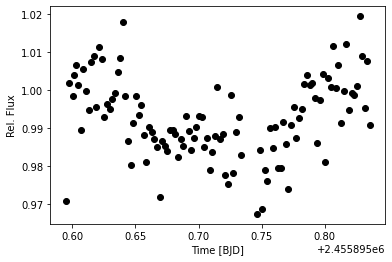

In [9]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(time, flux/airmasscorr, 'ko')
plt.xlabel("Time [BJD]")
plt.ylabel("Rel. Flux")

    Done!
Checking exotethys database...
Checking ephemerides database...
Checking photometry database...
Checking catalogues database...
    Done!
    Done!
	Updating:  ecc_planets.yaml
    Done!
	Updating:  ecc_stars.yaml
    Done!


Text(0, 0.5, 'Rel. Flux')

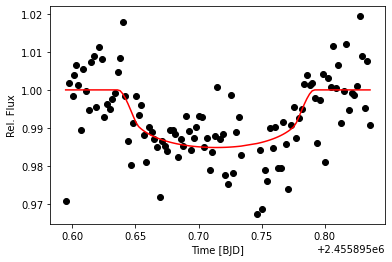

In [10]:
# let's over plot the transit model too
from exotic.api.elca import transit

plt.plot(time, flux/airmasscorr, 'ko')
plt.plot(time, transit(time, result.observations[0].parameters), 'r-')
plt.xlabel("Time [BJD]")
plt.ylabel("Rel. Flux")

## Fit a single lightcurve using EXOTIC

In [11]:
from exotic.api.elca import lc_fitter

# only define bounds for the "free" parameters during fitting
mybounds = {
    # [lower, upper]
    'rprs':[0,0.2],
    'tmid':[ result.ephemeris['Tc']-0.02,
             result.ephemeris['Tc']+0.02],
    'a2':[-0.5,0.5] # airmass curvature
}

myfit = lc_fitter(time, flux, fluxerr, airmass,
                  result.observations[0].parameters, # priors
                  mybounds, mode='ns' )  # ns = nested sampling, slow but robust + posteriors
                                         # lm = levenberg mardquart, fast but no uncertainties

[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-5e+01   [-45.6000..-45.6000]*| it/evals=5400/10772 eff=52.0632% N=400   00 0 
[ultranest] Likelihood function evaluations: 10810
[ultranest]   logZ = -54.5 +- 0.09669
[ultranest] Effective samples strategy satisfied (ESS = 2033.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.06 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.10, need <0.5)
[ultranest]   logZ error budget: single: 0.13 bs:0.10 tail:0.01 total:0.10 required:<0.50
[ultranest] done iterating.


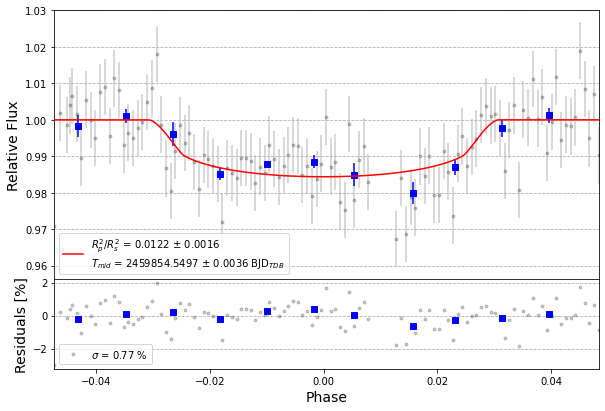

In [12]:
myfit.plot_bestfit()
plt.show()

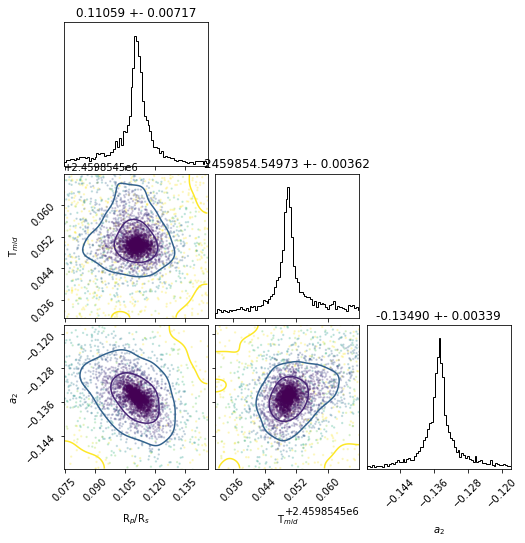

In [13]:
# show the posterior distributions
myfit.plot_triangle()
plt.show()

# Fit multiple light curves

After each light curve is fit, the mid-transit times are used along with values from the NASA Exoplanet Archive to derive a phase-folded fit with every dataset

In [14]:
from astropy.time import Time
from copy import deepcopy

# prep data for global fitter
input_data = []

# free parameters for each light curve
local_bounds = []

# copy default priors
prior = deepcopy(result.observations[0].parameters)

# aavso files on EW
for n,obs in enumerate(result.observations):

    try:
        time, flux, fluxerr, airmass, airmasscorr = obs.get_data()
    except:
        time, flux, fluxerr, airmass = obs.get_data()

    # ignore noisy data
    if np.std(flux) > 0.03:
        continue
    else:
        prior = deepcopy(result.observations[n].parameters)

        # add data to list
        input_data.append({
            'time':time,
            'flux':flux,
            'ferr':fluxerr,
            'airmass':airmass,
            'priors':prior,
            'name':f"{obs.obscode['id']}"
        })

        # set parameters to ephemeris
        input_data[-1]['priors']['per'] = result.ephemeris['Period']
        input_data[-1]['priors']['tmid'] = result.ephemeris['Tc']

    # add parameter for individual airmass detrending
    local_bounds.append({'a2':(-0.75,0.75)}) 
    # bounds will get overwritten by setting "individual_fit" flag in global fitter

    # print some timing info
    mint = Time(input_data[-1]['time'].min(),format='jd').isot
    maxt = Time(input_data[-1]['time'].max(),format='jd').isot
    maxphase = (input_data[-1]['time'].max() - prior['tmid'])/prior['per']
    minphase = (input_data[-1]['time'].min() - prior['tmid'])/prior['per']
    print(f"{input_data[-1]['name']} {len(input_data)} : {mint} ({minphase:.4f}) - {maxt} ({maxphase:.4f})")

NANF 1 : 2012-12-12T02:10:49.860 (-1421.0450) - 2012-12-12T07:53:12.775 (-1420.9507)
GELD 2 : 2012-12-17T03:01:54.006 (-1419.0468) - 2012-12-17T06:34:38.636 (-1418.9882)
FMAA 3 : 2013-10-23T01:58:05.470 (-1296.0459) - 2013-10-23T07:45:02.729 (-1295.9503)
FMAA 4 : 2013-10-28T02:44:57.399 (-1294.0488) - 2013-10-28T08:41:52.907 (-1293.9505)
NKED 5 : 2013-12-20T01:16:22.881 (-1273.0411) - 2013-12-20T06:40:19.617 (-1272.9518)
FGIC 6 : 2014-09-23T06:20:53.656 (-1163.0342) - 2014-09-23T11:26:54.743 (-1162.9499)
FTAC 7 : 2014-11-10T02:44:22.797 (-1144.0459) - 2014-11-10T08:23:14.119 (-1143.9525)
LGEC 8 : 2016-08-11T06:35:40.478 (-890.0086) - 2016-08-11T10:02:41.070 (-889.9515)
LPAC 9 : 2017-09-05T08:26:12.807 (-735.2129) - 2017-09-05T09:19:20.967 (-735.1983)
FMAA 10 : 2017-10-16T02:12:15.185 (-719.0458) - 2017-10-16T07:57:14.374 (-718.9508)
NKED 11 : 2017-10-21T03:07:19.347 (-717.0465) - 2017-10-21T08:54:09.355 (-716.9509)
MWAA 12 : 2017-12-08T00:38:39.840 (-698.0394) - 2017-12-08T04:57:12.960

In [15]:
import glob
from pylightcurve import exotethys

# generate limb darkening coefficients for TESS
get_prior = lambda key: float(result.priors[key]['value'])
u0,u1,u2,u3 = exotethys(get_prior('LOGG'), get_prior('T*'), get_prior('FE/H'), 'TESS', method='claret', stellar_model='phoenix')

# get files from local directory
tess_lightcurves = glob.glob('wasp1b*.txt')
print(tess_lightcurves)

# add TESS data
for n,lc in enumerate(tess_lightcurves):

        # read in data
        time, flux, fluxerr, airmass, airmasscorr = np.loadtxt(lc, unpack=True, delimiter=',')
        prior = deepcopy(result.observations[0].parameters)
        prior['u0'] = u0
        prior['u1'] = u1
        prior['u2'] = u2
        prior['u3'] = u3
        prior['tmid'] = result.ephemeris['Tc']
        prior['per'] = result.ephemeris['Period']
        prior['a2'] = 0.0
        
        # add data to list
        input_data.append({
            'time':time,
            'flux':flux,
            'ferr':fluxerr,
            'airmass':np.zeros(time.shape),
            'priors':prior,
            'name':f"TESS"
        })
    
        # no airmass detrending
        local_bounds.append({})

        # print some timing info
        mint = Time(input_data[-1]['time'].min(),format='jd').isot
        maxt = Time(input_data[-1]['time'].max(),format='jd').isot
        maxphase = (input_data[-1]['time'].max() - prior['tmid'])/prior['per']
        minphase = (input_data[-1]['time'].min() - prior['tmid'])/prior['per']
        print(f"{input_data[-1]['name']} {len(input_data)} : {mint} ({minphase:.4f}) - {maxt} ({maxphase:.4f})")

PHOENIX models are only computed for solar metallicity stars. Setting stellar_metallicity = 0.
['wasp1b_2459872_19_AAVSO_TESS.txt', 'wasp1b_2459854_55_AAVSO_TESS.txt', 'wasp1b_2459869_67_AAVSO_TESS.txt', 'wasp1b_2459867_15_AAVSO_TESS.txt', 'wasp1b_2459879_75_AAVSO_TESS.txt', 'wasp1b_2459857_07_AAVSO_TESS.txt', 'wasp1b_2459862_11_AAVSO_TESS.txt', 'wasp1b_2459859_59_AAVSO_TESS.txt', 'wasp1b_2459877_23_AAVSO_TESS.txt']
TESS 15 : 2022-10-19T09:49:57.068 (6.8891) - 2022-10-19T23:13:56.410 (7.1107)
TESS 16 : 2022-10-01T18:28:56.315 (-0.1108) - 2022-10-02T07:52:57.070 (0.1107)
TESS 17 : 2022-10-16T21:21:19.315 (5.8892) - 2022-10-17T10:44:58.928 (6.1106)
TESS 18 : 2022-10-14T08:52:40.365 (4.8892) - 2022-10-14T17:53:00.225 (5.0381)
TESS 19 : 2022-10-26T23:16:04.119 (9.8891) - 2022-10-27T12:40:02.857 (10.1107)
TESS 20 : 2022-10-04T06:57:39.173 (0.8892) - 2022-10-04T20:21:39.635 (1.1107)
TESS 21 : 2022-10-09T07:55:01.507 (2.8891) - 2022-10-09T21:19:01.529 (3.1107)
TESS 22 : 2022-10-06T19:26:20.83

In [16]:
from exotic.api.elca import glc_fitter

# bounds shared by all light curves
global_bounds = {
    'rprs':(prior['rprs']*0.75, prior['rprs']*1.33),
    'inc':(prior['inc']-3, min(90,prior['inc']+3)),
    'per':( result.ephemeris['Period']-0.001, 
            result.ephemeris['Period']+0.001),
    'tmid':( result.ephemeris['Tc']-0.02,
             result.ephemeris['Tc']+0.02),
}

global_fit = glc_fitter(input_data, global_bounds, local_bounds, individual_fit=True, verbose=True)

Fitting individual light curve 1/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-4e+01   [-35.7117..-35.7116]*| it/evals=5280/10217 eff=53.7843% N=400        
[ultranest] Likelihood function evaluations: 10235
[ultranest]   logZ = -44.25 +- 0.09348
[ultranest] Effective samples strategy satisfied (ESS = 2126.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.05 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.09, need <0.5)
[ultranest]   logZ error budget: single: 0.13 bs:0.09 tail:0.01 total:0.09 required:<0.50
[ultranest] done iterating.
NANF & 2456273.59085486 & 2456273.82862008 & 0.0124956530723525 & 113
Fitting individual light curve 2/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-4e+01   [-43.6381..-43.6381]*| it/evals=5080/9891 eff=53.5244% N=400 0  0  0 
[ultranest] Likelihood function evaluations: 9940
[ultranest]   logZ = -51.75 +- 0.07591
[ultranest] Effective samples strategy satisfied (ESS = 1982.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.05 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.08, need <0.5)
[ultranest]   logZ error budget: single: 0.13 bs:0.08 tail:0.01 total:0.08 required:<0.50
[ultranest] done iterating.
GELD & 2456278.62631951 & 2456278.77405829 & 0.006217346300001895 & 70
Fitting individual light curve 3/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-5e+01   [-54.6896..-54.6896]*| it/evals=5130/8842 eff=60.7676% N=400    00  
[ultranest] Likelihood function evaluations: 8869
[ultranest]   logZ = -62.91 +- 0.1144
[ultranest] Effective samples strategy satisfied (ESS = 1889.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.11, need <0.5)
[ultranest]   logZ error budget: single: 0.13 bs:0.11 tail:0.01 total:0.11 required:<0.50
[ultranest] done iterating.
FMAA & 2456588.58200776 & 2456588.82294825 & 0.0043307665958584735 & 115
Fitting individual light curve 4/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-6e+01   [-57.5775..-57.5773]*| it/evals=4770/9086 eff=54.9160% N=400 0    
[ultranest] Likelihood function evaluations: 9124
[ultranest]   logZ = -64.92 +- 0.07818
[ultranest] Effective samples strategy satisfied (ESS = 1795.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.08, need <0.5)
[ultranest]   logZ error budget: single: 0.12 bs:0.08 tail:0.01 total:0.08 required:<0.50
[ultranest] done iterating.
FMAA & 2456593.61455323 & 2456593.86241791 & 0.004562492322106042 & 118
Fitting individual light curve 5/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-3e+01   [-26.2282..-26.2281]*| it/evals=4480/8189 eff=57.5170% N=400    0   
[ultranest] Likelihood function evaluations: 8214
[ultranest]   logZ = -32.8 +- 0.06353
[ultranest] Effective samples strategy satisfied (ESS = 1925.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.06 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.06, need <0.5)
[ultranest]   logZ error budget: single: 0.11 bs:0.06 tail:0.01 total:0.06 required:<0.50
[ultranest] done iterating.
NKED & 2456646.5530426 & 2456646.77800483 & 0.00882119052120192 & 107
Fitting individual light curve 6/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-3e+01   [-29.8142..-29.8142]*| it/evals=4720/8860 eff=55.7920% N=400 0    
[ultranest] Likelihood function evaluations: 8891
[ultranest]   logZ = -37.04 +- 0.08242
[ultranest] Effective samples strategy satisfied (ESS = 1824.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.05 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.08, need <0.5)
[ultranest]   logZ error budget: single: 0.12 bs:0.08 tail:0.01 total:0.08 required:<0.50
[ultranest] done iterating.
FGIC & 2456923.76450991 & 2456923.97702249 & 0.0066185406959523635 & 110
Fitting individual light curve 7/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-5e+01   [-50.7308..-50.7308]*| it/evals=4720/10354 eff=47.4181% N=400    0 
[ultranest] Likelihood function evaluations: 10397
[ultranest]   logZ = -57.9 +- 0.07356
[ultranest] Effective samples strategy satisfied (ESS = 2068.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.05 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.07, need <0.5)
[ultranest]   logZ error budget: single: 0.12 bs:0.07 tail:0.01 total:0.07 required:<0.50
[ultranest] done iterating.
FTAC & 2456971.61415274 & 2456971.84946897 & 0.008035683063128095 & 113
Fitting individual light curve 8/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-2e+01   [-18.4683..-18.4680]*| it/evals=3854/8313 eff=48.7047% N=400 0  
[ultranest] Likelihood function evaluations: 8343
[ultranest]   logZ = -23.49 +- 0.06398
[ultranest] Effective samples strategy satisfied (ESS = 1728.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.06 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.06, need <0.5)
[ultranest]   logZ error budget: single: 0.10 bs:0.06 tail:0.01 total:0.06 required:<0.50
[ultranest] done iterating.
LGEC & 2457611.77477405 & 2457611.9185309 & 0.013559586653548115 & 59
Fitting individual light curve 9/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-2e+01   [-24.4574..-24.4574]*| it/evals=1710/2838 eff=70.1395% N=400 
[ultranest] Likelihood function evaluations: 2849
[ultranest]   logZ = -25.28 +- 0.02375
[ultranest] Effective samples strategy satisfied (ESS = 1143.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.04, need <0.5)
[ultranest]   logZ error budget: single: 0.03 bs:0.02 tail:0.03 total:0.04 required:<0.50
[ultranest] done iterating.
LPAC & 2458001.85153712 & 2458001.88843712 & 0.013589240522215556 & 50
Fitting individual light curve 10/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-7e+01   [-66.7785..-66.7785]*| it/evals=5120/9067 eff=59.0747% N=400    0  0 
[ultranest] Likelihood function evaluations: 9069
[ultranest]   logZ = -74.96 +- 0.09854
[ultranest] Effective samples strategy satisfied (ESS = 1897.3, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.10, need <0.5)
[ultranest]   logZ error budget: single: 0.13 bs:0.10 tail:0.01 total:0.10 required:<0.50
[ultranest] done iterating.
FMAA & 2458042.59184242 & 2458042.83141636 & 0.006627302054959578 & 112
Fitting individual light curve 11/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-1e+02  .03 [-128.1083..-128.1082]*| it/evals=4960/9400 eff=55.1111% N=400  
[ultranest] Likelihood function evaluations: 9471
[ultranest]   logZ = -136 +- 0.08806
[ultranest] Effective samples strategy satisfied (ESS = 1972.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.05 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.09, need <0.5)
[ultranest]   logZ error budget: single: 0.13 bs:0.09 tail:0.01 total:0.09 required:<0.50
[ultranest] done iterating.
NKED & 2458047.63008503 & 2458047.87094161 & 0.009020444082726063 & 115
Fitting individual light curve 12/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-3e+02  .81 [-342.9871..-342.9870]*| it/evals=6906/14692 eff=48.3207% N=400        0  
[ultranest] Likelihood function evaluations: 14715
[ultranest]   logZ = -355.6 +- 0.1164
[ultranest] Effective samples strategy satisfied (ESS = 1856.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.12, need <0.5)
[ultranest]   logZ error budget: single: 0.17 bs:0.12 tail:0.01 total:0.12 required:<0.50
[ultranest] done iterating.
MWAA & 2458095.52685 & 2458095.7064 & 0.004108531537542863 & 400
Fitting individual light curve 13/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-4e+01   [-37.8656..-37.8647]*| it/evals=4880/10710 eff=47.3327% N=400   0  0 
[ultranest] Likelihood function evaluations: 10765
[ultranest]   logZ = -45.46 +- 0.08792
[ultranest] Effective samples strategy satisfied (ESS = 1859.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.09, need <0.5)
[ultranest]   logZ error budget: single: 0.12 bs:0.09 tail:0.01 total:0.09 required:<0.50
[ultranest] done iterating.
GDAI & 2458100.54647177 & 2458100.79945865 & 0.007863187077689748 & 121
Fitting individual light curve 14/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-6e+01   [-58.3546..-58.3545]*| it/evals=4591/8597 eff=56.0083% N=400   0 
[ultranest] Likelihood function evaluations: 8609
[ultranest]   logZ = -65.21 +- 0.09387
[ultranest] Effective samples strategy satisfied (ESS = 1892.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.09, need <0.5)
[ultranest]   logZ error budget: single: 0.12 bs:0.09 tail:0.01 total:0.09 required:<0.50
[ultranest] done iterating.
NANF & 2458420.58217494 & 2458420.82285392 & 0.01011593108840008 & 117
Fitting individual light curve 15/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-1e+03  152.24 [-1152.2546..-1152.2545]*| it/evals=4541/6332 eff=76.5509% N=400 
[ultranest] Likelihood function evaluations: 6332
[ultranest]   logZ = -1159 +- 0.09348
[ultranest] Effective samples strategy satisfied (ESS = 1658.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.05 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.09, need <0.5)
[ultranest]   logZ error budget: single: 0.12 bs:0.09 tail:0.01 total:0.09 required:<0.50
[ultranest] done iterating.
TESS & 2459871.90968829 & 2459872.46801401 & 0.004216161231437193 & 2354
Fitting individual light curve 16/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-1e+03  134.16 [-1134.1840..-1134.1839]*| it/evals=4480/6460 eff=73.9274% N=400 
[ultranest] Likelihood function evaluations: 6480
[ultranest]   logZ = -1141 +- 0.08338
[ultranest] Effective samples strategy satisfied (ESS = 1651.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.08, need <0.5)
[ultranest]   logZ error budget: single: 0.12 bs:0.08 tail:0.01 total:0.08 required:<0.50
[ultranest] done iterating.
TESS & 2459854.27009624 & 2459854.82843831 & 0.004208519049932949 & 2326
Fitting individual light curve 17/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-1e+03  053.90 [-1053.9514..-1053.9512]*| it/evals=4498/6698 eff=71.4195% N=400 
[ultranest] Likelihood function evaluations: 6715
[ultranest]   logZ = -1061 +- 0.08619
[ultranest] Effective samples strategy satisfied (ESS = 1518.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.09, need <0.5)
[ultranest]   logZ error budget: single: 0.12 bs:0.09 tail:0.01 total:0.09 required:<0.50
[ultranest] done iterating.
TESS & 2459869.38980689 & 2459869.94790426 & 0.004072345004751603 & 2308
Fitting individual light curve 18/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-9e+02  .98 [-937.0415..-937.0413]*| it/evals=4470/6774 eff=70.1286% N=400   
[ultranest] Likelihood function evaluations: 6793
[ultranest]   logZ = -943.6 +- 0.08504
[ultranest] Effective samples strategy satisfied (ESS = 1685.0, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.06 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.09, need <0.5)
[ultranest]   logZ error budget: single: 0.12 bs:0.09 tail:0.01 total:0.09 required:<0.50
[ultranest] done iterating.
TESS & 2459866.86991163 & 2459867.24514149 & 0.004673444944899993 & 1556
Fitting individual light curve 19/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-1e+03  176.46 [-1176.4836..-1176.4836]*| it/evals=4410/6628 eff=70.8092% N=400 
[ultranest] Likelihood function evaluations: 6638
[ultranest]   logZ = -1183 +- 0.08069
[ultranest] Effective samples strategy satisfied (ESS = 1613.5, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.08, need <0.5)
[ultranest]   logZ error budget: single: 0.12 bs:0.08 tail:0.01 total:0.08 required:<0.50
[ultranest] done iterating.
TESS & 2459879.46949212 & 2459880.02781085 & 0.004274972647489715 & 2336
Fitting individual light curve 20/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-1e+03  152.35 [-1152.3924..-1152.3924]*| it/evals=4360/6417 eff=72.4614% N=400 
[ultranest] Likelihood function evaluations: 6424
[ultranest]   logZ = -1159 +- 0.07411
[ultranest] Effective samples strategy satisfied (ESS = 1565.7, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.07, need <0.5)
[ultranest]   logZ error budget: single: 0.12 bs:0.07 tail:0.01 total:0.07 required:<0.50
[ultranest] done iterating.
TESS & 2459856.79003672 & 2459857.3483754 & 0.004219543783676614 & 2350
Fitting individual light curve 21/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-1e+03  124.43 [-1124.4665..-1124.4665]*| it/evals=4520/7366 eff=64.8866% N=400 
[ultranest] Likelihood function evaluations: 7367
[ultranest]   logZ = -1131 +- 0.09153
[ultranest] Effective samples strategy satisfied (ESS = 1556.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.45+-0.08 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.09, need <0.5)
[ultranest]   logZ error budget: single: 0.12 bs:0.09 tail:0.01 total:0.09 required:<0.50
[ultranest] done iterating.
TESS & 2459861.82987855 & 2459862.38821214 & 0.004173376049754895 & 2342
Fitting individual light curve 22/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-1e+03  359.20 [-1359.2271..-1359.2270]*| it/evals=4500/6418 eff=74.7757% N=400 
[ultranest] Likelihood function evaluations: 6429
[ultranest]   logZ = -1366 +- 0.079
[ultranest] Effective samples strategy satisfied (ESS = 1640.1, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.06 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.08, need <0.5)
[ultranest]   logZ error budget: single: 0.12 bs:0.08 tail:0.01 total:0.08 required:<0.50
[ultranest] done iterating.
TESS & 2459859.30996341 & 2459859.86829941 & 0.0045832301744472784 & 2350
Fitting individual light curve 23/23
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-1e+03  070.61 [-1070.6346..-1070.6346]*| it/evals=4462/6380 eff=74.6154% N=400 
[ultranest] Likelihood function evaluations: 6383
[ultranest]   logZ = -1077 +- 0.09989
[ultranest] Effective samples strategy satisfied (ESS = 1611.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.10, need <0.5)
[ultranest]   logZ error budget: single: 0.12 bs:0.10 tail:0.01 total:0.10 required:<0.50
[ultranest] done iterating.
TESS & 2459876.94964526 & 2459877.50773454 & 0.004080358730437356 & 2334
[ultranest] Sampling 400 live points from prior ...


[ultranest] Explored until L=-1e+04  -11189.26 [-11191.0108..-11191.0106]*| it/evals=16797/492677 eff=3.4121% N=400 
[ultranest] Likelihood function evaluations: 492677
[ultranest]   logZ = -1.123e+04 +- 0.1872
[ultranest] Effective samples strategy satisfied (ESS = 4058.4, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.19, need <0.5)
[ultranest]   logZ error budget: single: 0.28 bs:0.19 tail:0.01 total:0.19 required:<0.50
[ultranest] done iterating.


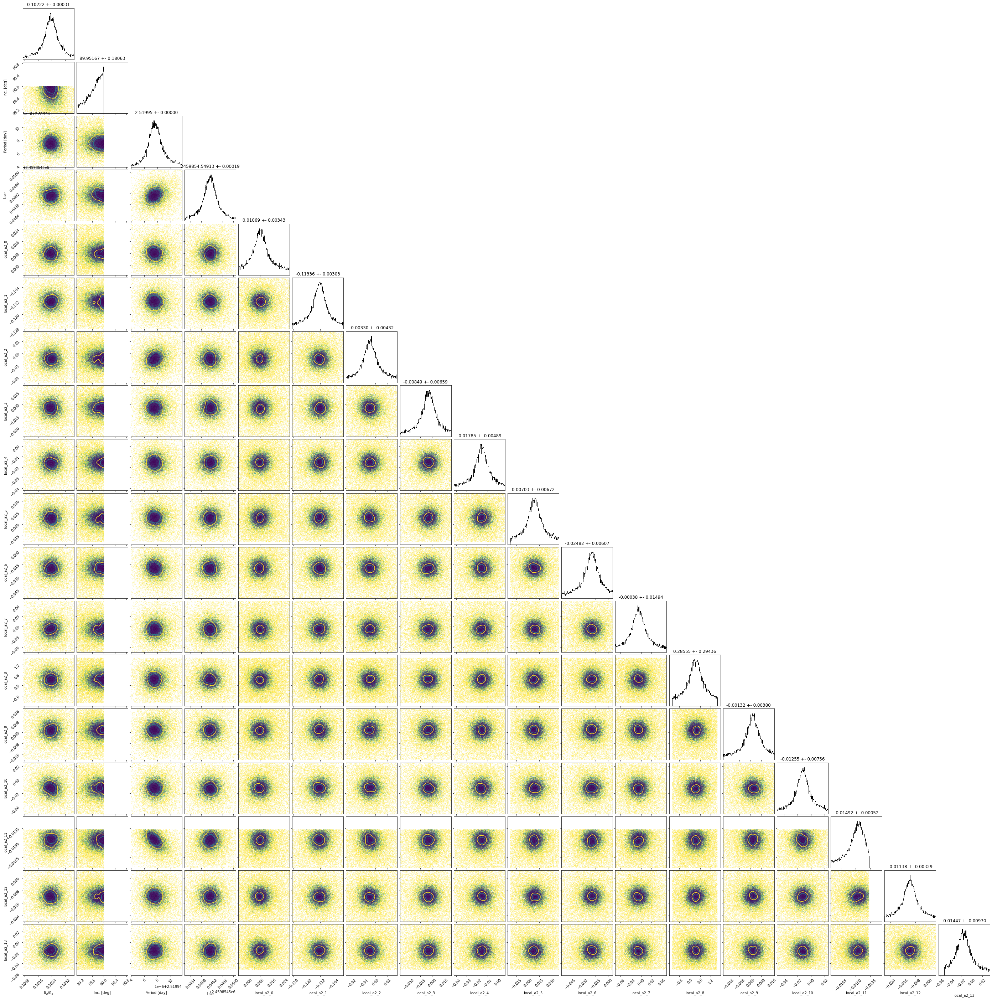

In [17]:
global_fit.plot_triangle()
plt.savefig("posteriors.png",facecolor='white')

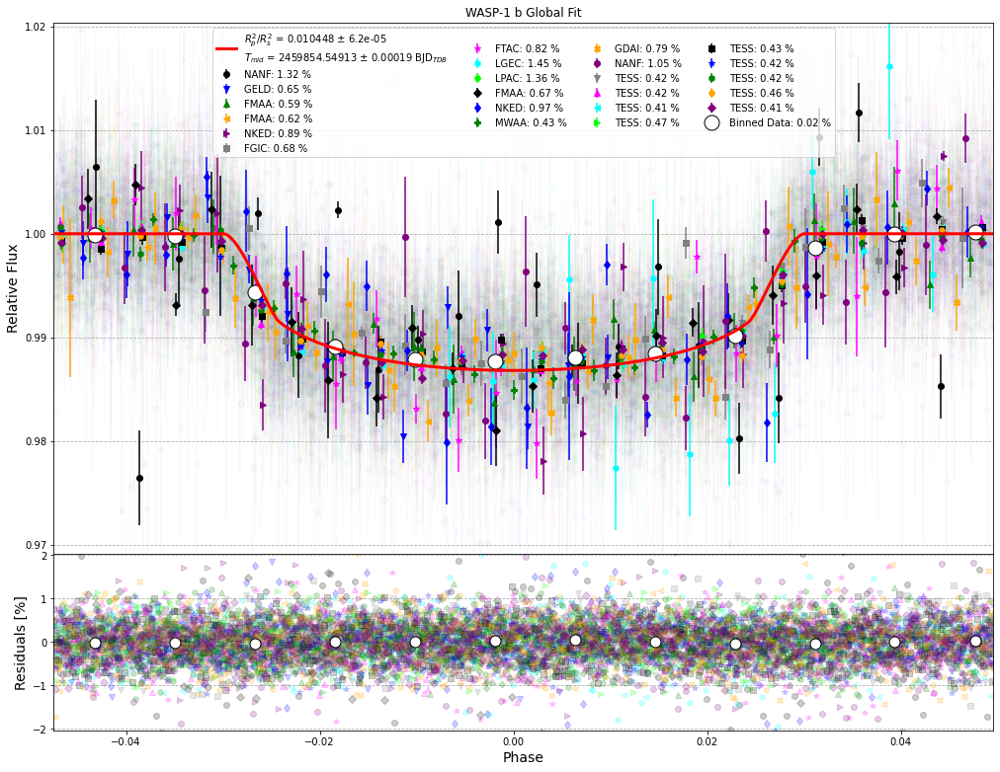

In [18]:
global_fit.plot_bestfit(alpha=0.025, bin_dt = 15./60/24, title="WASP-1 b Global Fit",phase_limits='median')
plt.savefig("bestfit.png",facecolor='white')

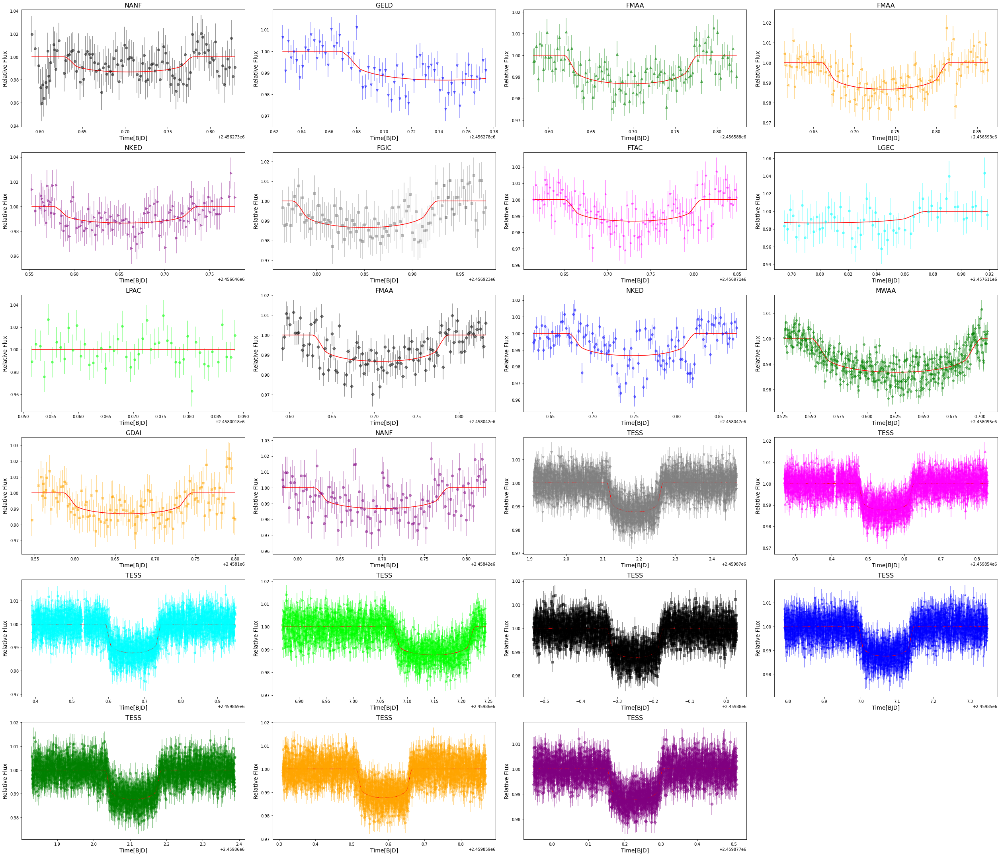

In [19]:
global_fit.plot_bestfits()
plt.savefig("bestfits.png",facecolor='white')
#myfit.plot_stack(dy=0.03)
#plt.savefig("stackfit.png",facecolor='white')

In [20]:
# best-fit parameters from global fit
global_fit.parameters.keys()

dict_keys(['u0', 'u1', 'u2', 'u3', 'ecc', 'inc', 'omega', 'duration', 'tmid', 'a1', 'a2', 'ars', 'rprs', 'per', 'local_a2_0', 'local_a2_1', 'local_a2_2', 'local_a2_3', 'local_a2_4', 'local_a2_5', 'local_a2_6', 'local_a2_7', 'local_a2_8', 'local_a2_9', 'local_a2_10', 'local_a2_11', 'local_a2_12', 'local_a2_13'])

In [21]:
# compare global ephemeris to values from EW
result.ephemeris.keys()

dict_keys(['Tc', 'Tcs', 'files', 'notes', 'Period', 'Tc_err', 'epochs', 'Tcs_err', 'datasets', 'nea_tmids', 'residuals', 'timesaved', 'Period_err', 'nea_epochs', 'nea_tmids_err', 'nea_references', 'ephemeris_url'])

In [22]:
result.ephemeris['nea_tmids']

['2453912.5147133335',
 '2454461.86099',
 '2455215.32701',
 '2455530.3197',
 '2456543.33866',
 '2459854.549103']

In [23]:
from exotic.api.nested_linear_fitter import linear_fitter

# min and max values to search between for fitting the ephemeris
bounds = {
    'm':[ # orbital period
        global_fit.parameters['per']-5*global_fit.errors['per'], 
        global_fit.parameters['per']+5*global_fit.errors['per']
    ], 
    'b':[ # mid-transit time
        global_fit.parameters['tmid']-5*global_fit.errors['tmid'],
        global_fit.parameters['tmid']+5*global_fit.errors['tmid']
    ] 
}

# used to plot red overlay in O-C figure
prior = {
    'm':[global_fit.parameters['per'], global_fit.errors['per']],   # value from global
    'b':[global_fit.parameters['tmid'], global_fit.errors['tmid']]  # value from WLS
}

/Users/kpearson/anaconda3/lib/python3.8/site-packages/exotic/api/nested_linear_fitter.py:49: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [24]:
# combine the good data from Exoplanet Watch and NASA Exoplanet Archive
Tcs = np.array(result.ephemeris['Tcs'] + result.ephemeris['nea_tmids'], dtype=float)
Tcs_err = np.array(result.ephemeris['Tcs_err'] + result.ephemeris['nea_tmids_err'], dtype=float)

# fit the data and compare ephemeris to global light curve fit
lf = linear_fitter( Tcs, Tcs_err, bounds, prior=prior )

[ultranest] Sampling 420 live points from prior ...


[ultranest] Explored until L=-3e+01  
[ultranest] Likelihood function evaluations: 5420
[ultranest]   logZ = -38.53 +- 0.05934
[ultranest] Effective samples strategy satisfied (ESS = 1634.6, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.06, need <0.5)
[ultranest]   logZ error budget: single: 0.10 bs:0.06 tail:0.01 total:0.06 required:<0.50
[ultranest] done iterating.


image saved to: posterior.png


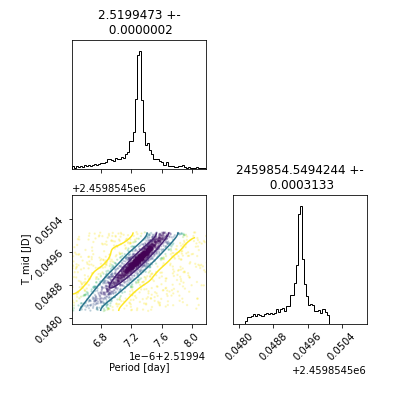

In [25]:
lf.plot_triangle()
plt.subplots_adjust(top=0.9,hspace=0.2,wspace=0.2)
plt.savefig("posterior.png",facecolor='white')
plt.close()
print("image saved to: posterior.png")
Image("posterior.png")

/Users/kpearson/anaconda3/lib/python3.8/site-packages/exotic/api/nested_linear_fitter.py:173: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(dt)


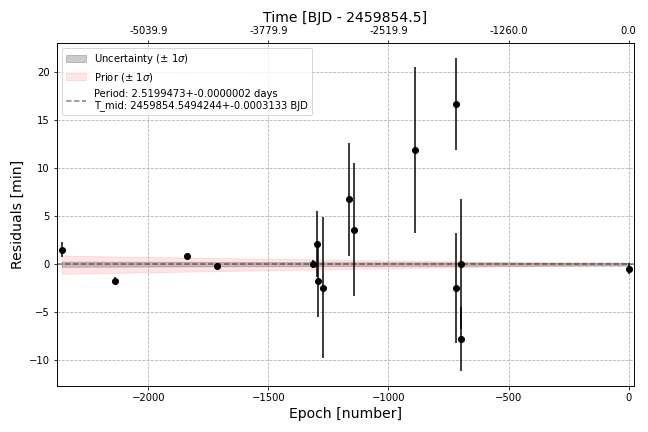

In [26]:
fig,ax = lf.plot_oc()
plt.tight_layout()
plt.savefig("oc.png",facecolor='white')
plt.close()
Image("oc.png")

In [28]:
# combine the good data from Exoplanet Watch and NASA Exoplanet Archive
Tcs = np.array(result.ephemeris['Tcs'] + result.ephemeris['nea_tmids'], dtype=float)
Tcs_err = np.array(result.ephemeris['Tcs_err'] + result.ephemeris['nea_tmids_err'], dtype=float)

# fit the data and compare ephemeris to global light curve fit
lf = linear_fitter( Tcs, Tcs_err, bounds, prior=prior )

[ultranest] Sampling 420 live points from prior ...


[ultranest] Explored until L=-3e+01  
[ultranest] Likelihood function evaluations: 5427
[ultranest]   logZ = -38.54 +- 0.07881
[ultranest] Effective samples strategy satisfied (ESS = 1609.2, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.07 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.08, need <0.5)
[ultranest]   logZ error budget: single: 0.10 bs:0.08 tail:0.01 total:0.08 required:<0.50
[ultranest] done iterating.


[ultranest] Sampling 420 live points from prior ...


[ultranest] Explored until L=-6e+01  
[ultranest] Likelihood function evaluations: 5796
[ultranest]   logZ = -67.82 +- 0.09724
[ultranest] Effective samples strategy satisfied (ESS = 1679.8, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.46+-0.06 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.10, need <0.5)
[ultranest]   logZ error budget: single: 0.10 bs:0.10 tail:0.01 total:0.10 required:<0.50
[ultranest] done iterating.


/Users/kpearson/anaconda3/lib/python3.8/site-packages/exotic/api/nested_linear_fitter.py:173: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(dt)


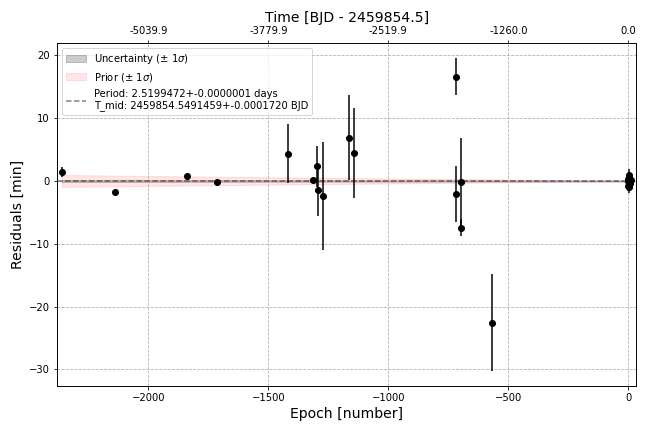

In [29]:
# look at data from individual light curves in global fit
tmids = [lcfit['individual']['tmid'] for lcfit in global_fit.lc_data]
tmids_err = [lcfit['individual_err']['tmid'] for lcfit in global_fit.lc_data]
res_stdev = [lcfit['res_stdev'] for lcfit in global_fit.lc_data]
rprs2 = [lcfit['individual']['rprs']**2 for lcfit in global_fit.lc_data]
rprs = [lcfit['individual']['rprs'] for lcfit in global_fit.lc_data]
rprs_err = [lcfit['individual_err']['rprs'] for lcfit in global_fit.lc_data]
name = [lcfit['name'] for lcfit in global_fit.lc_data]

# filter bad data
mask = (res_stdev < np.mean(rprs2)) & (np.mean(rprs) > 5 * np.mean(rprs_err))
# filter based on quality? 

tmids = np.array(tmids)[mask]
tmids_err = np.array(tmids_err)[mask]

# combine with nea data
tmids = np.array(list(tmids) + result.ephemeris['nea_tmids'], dtype=float)
tmids_err = np.array(list(tmids_err) + result.ephemeris['nea_tmids_err'], dtype=float)

# fit the data and compare ephemeris to global light curve fit
lf = linear_fitter( tmids, tmids_err, bounds, prior=prior )

fig,ax = lf.plot_oc()
plt.tight_layout()
plt.savefig("oc_global.png",facecolor='white')
plt.close()
Image("oc_global.png")

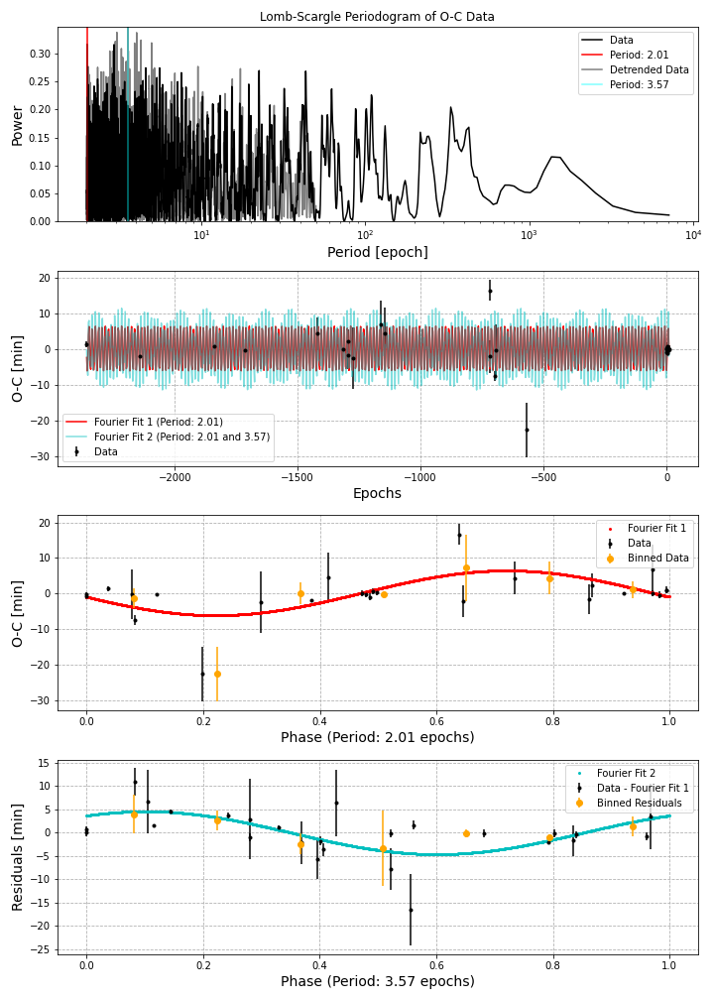

In [30]:
fig,ax = lf.plot_periodogram()
plt.tight_layout()
plt.savefig("plot_periodogram.png",facecolor='white')
plt.close()
Image("plot_periodogram.png")